### **Question 1**


In [ ]:
#X_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

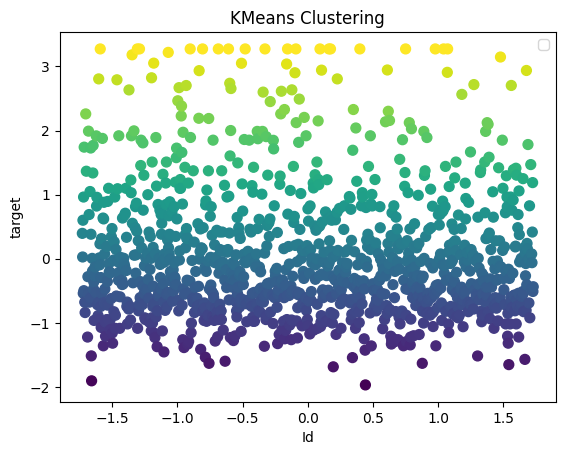

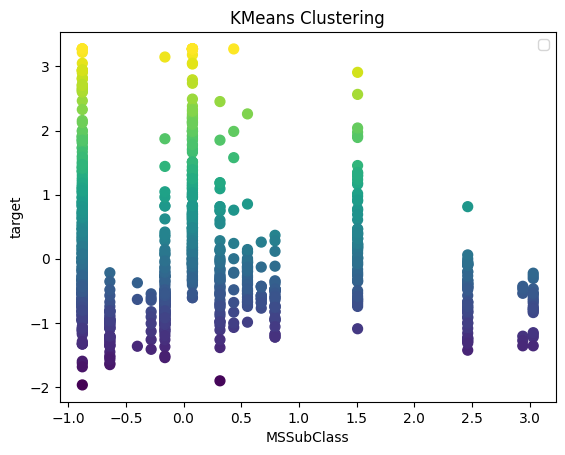

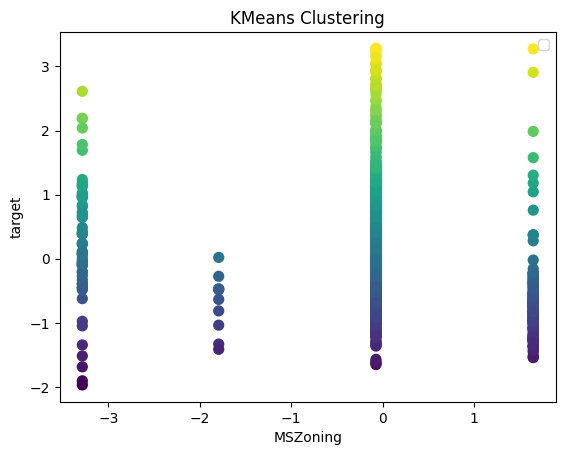

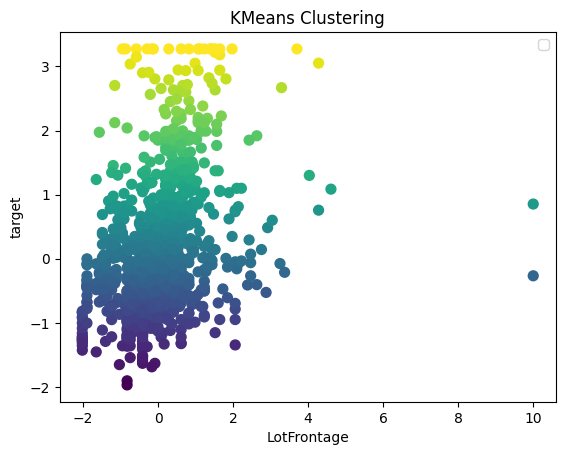

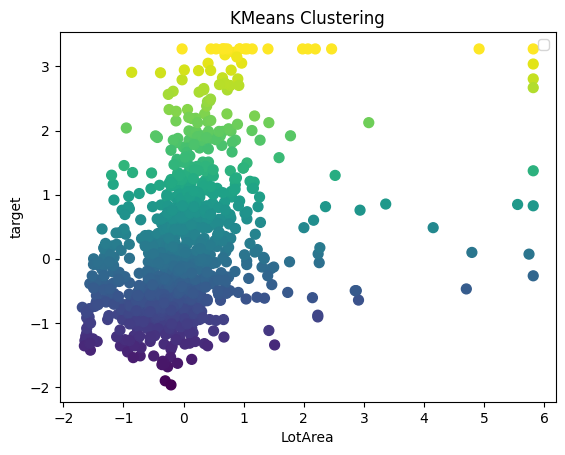

...

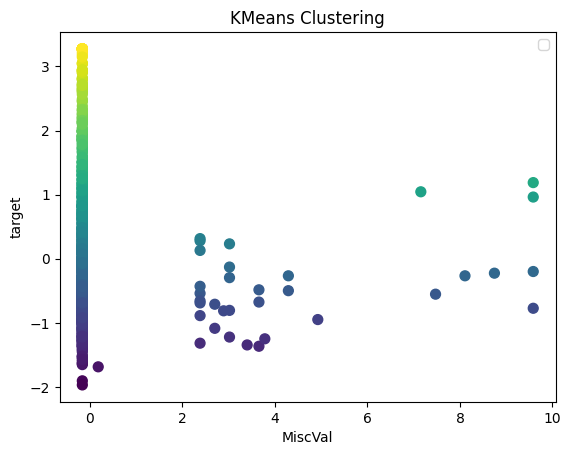

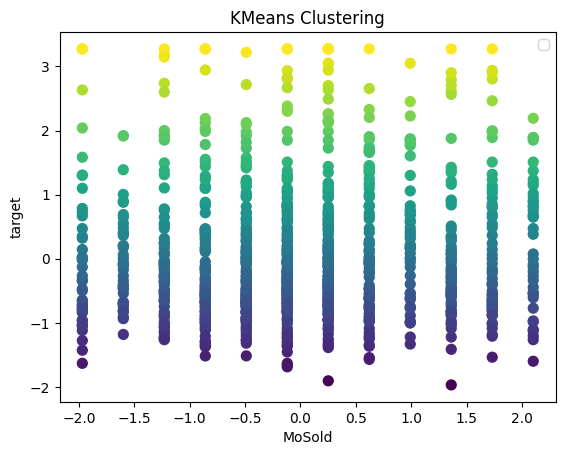

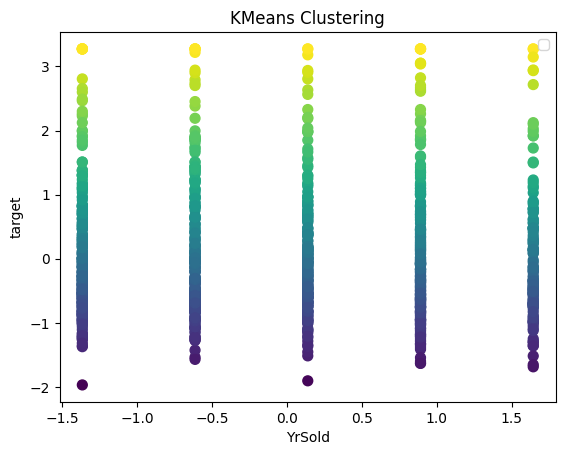

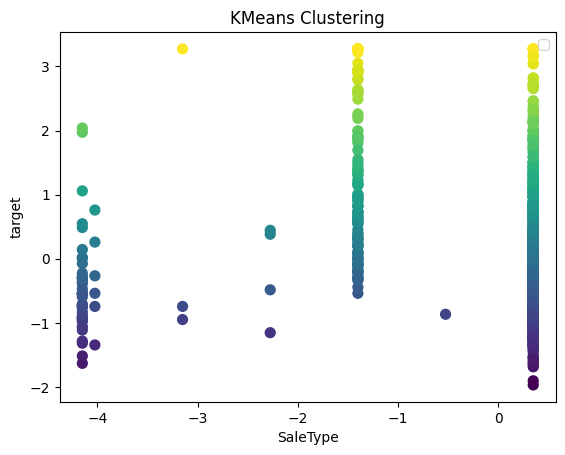

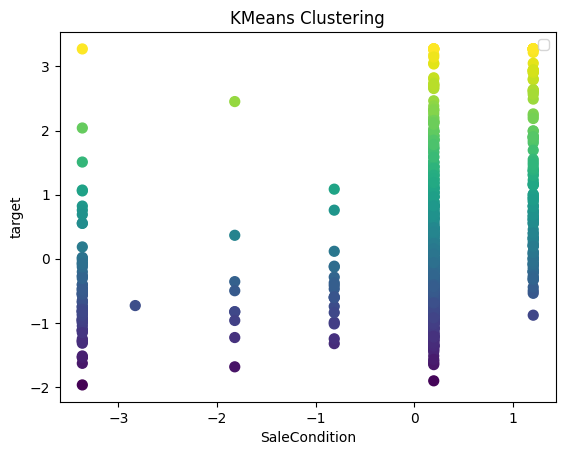

In [ ]:
#insights
'''
for col in X_train.columns:
  plt.scatter(X_train[col], y_train,
    c=y_train,
    cmap='viridis',
    s=50 ) # marker size
  plt.title('KMeans Clustering')
  plt.xlabel(col)
  plt.ylabel('target')
  plt.legend()
  plt.show()
'''

In [ ]:
# libraries
'''
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
!pip install gradio
import gradio as gr
'''

In [144]:
# data uploading
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [143]:
# preprocessing

def preprocess(data):

  try:
    data['SalePrice'] = data['SalePrice'].astype(int)
  except:
    pass

  # convering all to int
  label_encoder = LabelEncoder()
  for col in data.select_dtypes(include='object'):
    data[col] = data[col].astype(str)
    data[col] = label_encoder.fit_transform(data[col])

  for col in data.select_dtypes(include='int'):

    # nulls
    data[col].fillna(data[col].mean(), inplace = True)

    # outliers
    ub = data[col].mean() + 3*data[col].std()
    lb = data[col].mean() - 3*data[col].std()
    #data.loc[((data[col]<lb) | (data[col]>ub)), col] = data[col].mean()
    data.loc[(data[col]<lb), col]/= 10
    data.loc[(data[col]>ub), col]*= 10
    data[col] = data[col].clip(lower=lb, upper=ub)
    # normalisation
    #data[col] = (data[col] - data[col].mean())/data[col].std()

  data = (data - data.mean())/data.std()

  return data

#train = pd.get_dummies(train, train.select_dtypes(include='object'))

'''
Features used (after gathering insights from clustering)
       'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Alley', 'LotShape',
       'LandContour', 'LotConfig','LandSlope', 'Neighborhood', 'Condition1',
       'BldgType','HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd','RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrType','MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual','BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF','HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu',
       'GarageType', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch',
       'ScreenPorch', 'PoolArea', 'PoolQC', 'Fence', 'SaleType', 'SaleCondition
'''

def makedata(data):

  data.drop_duplicates(inplace = True)
  data.dropna(thresh = 20, inplace = True)

  # here we remove the features that did not impact the target variable much
  # based on the visualised clusters
  try:
    data.drop(columns = ['Id', 'MiscFeature', 'Street', 'Utilities', 'Heating',
                         'BsmtFullBath', 'BsmtHalfBath', 'GarageFinish',
                         '3SsnPorch', 'MiscVal', 'MoSold', 'YrSold'],
              inplace = True)
  except:
    pass

  data = preprocess(data)

  data.dropna(inplace = True)

  return data

def givedata(test, train = pd.read_csv("train.csv")):
  train= makedata(train)
  test.fillna(0, inplace = True)
  test = makedata(test)
  # target variable is y = SalePrice
  X_train = train.drop(columns = ["SalePrice"])
  y_train = train["SalePrice"]
  return X_train, y_train, test

In [145]:
# KNN regressor
def knnreg(X_train, y_train, test):
  knn_regressor = KNeighborsRegressor(n_neighbors=5)

  # training
  knn_regressor.fit(X_train, y_train)

  # predicting
  y_pred = knn_regressor.predict(test)

  return y_pred


In [146]:
def predict(test, train = pd.read_csv("train.csv")):
  X_train, y_train, test= givedata(train, test)
  y_pred = knnreg(X_train, y_train, test)
  return y_pred

In [ ]:
ypred = predict(test, train)
ypred = pd.DataFrame(ypred)
ypred.to_csv("Predictions.csv")

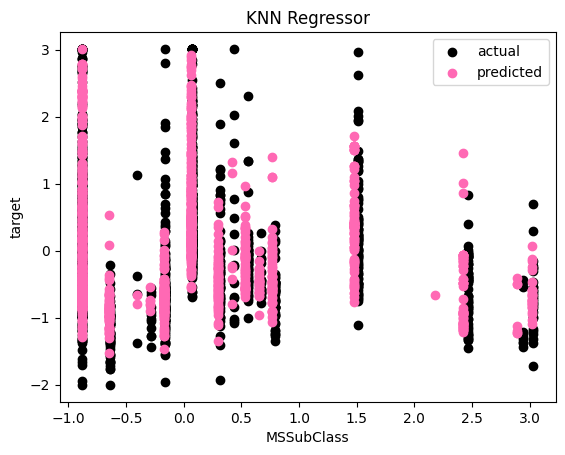

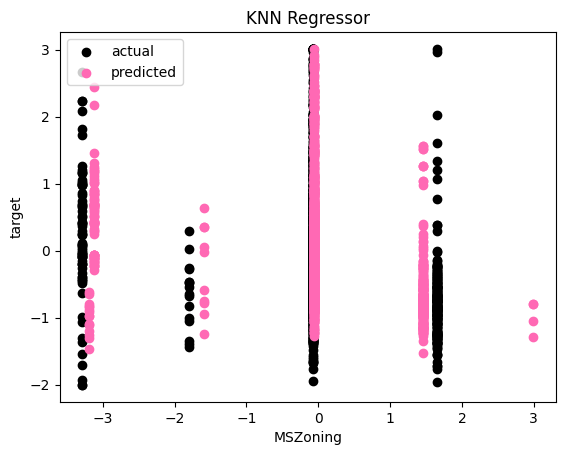

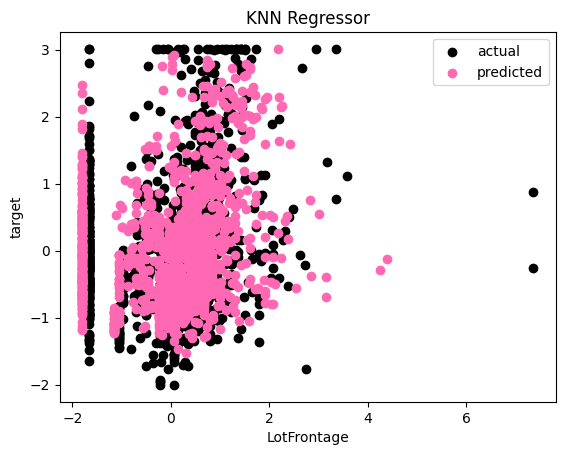

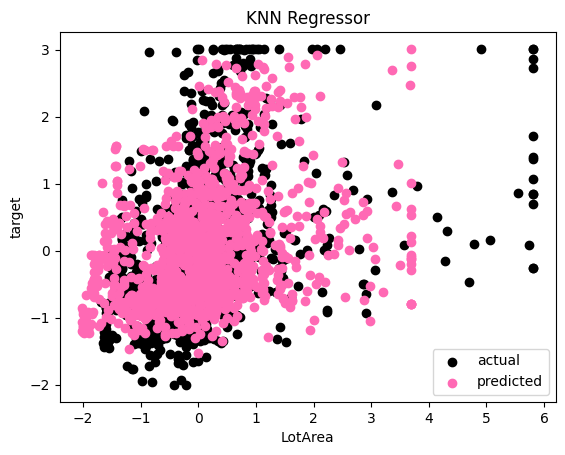

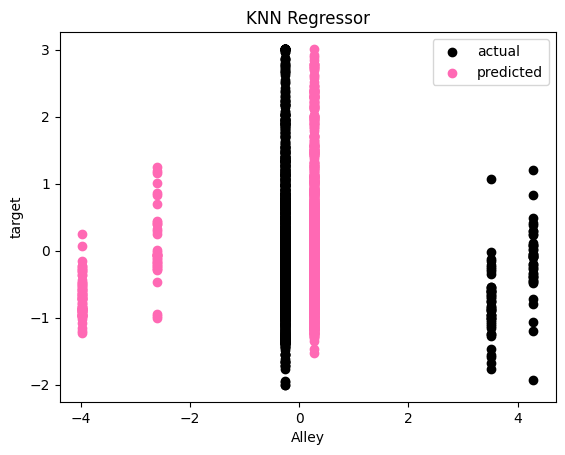

...

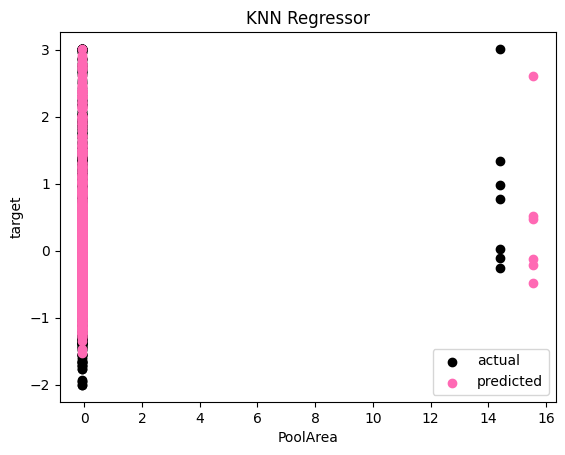

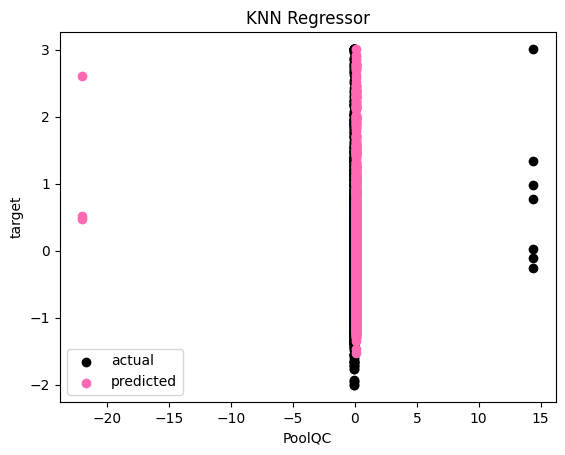

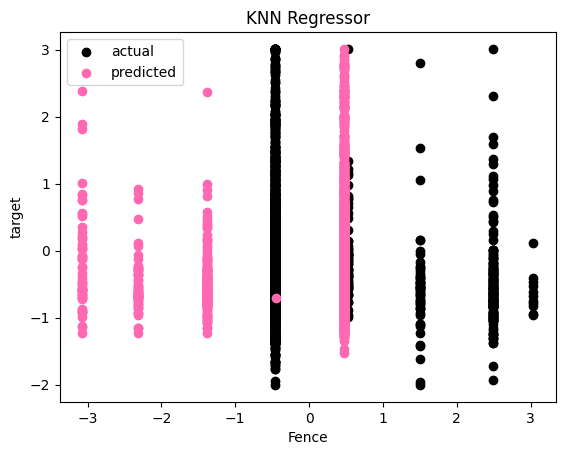

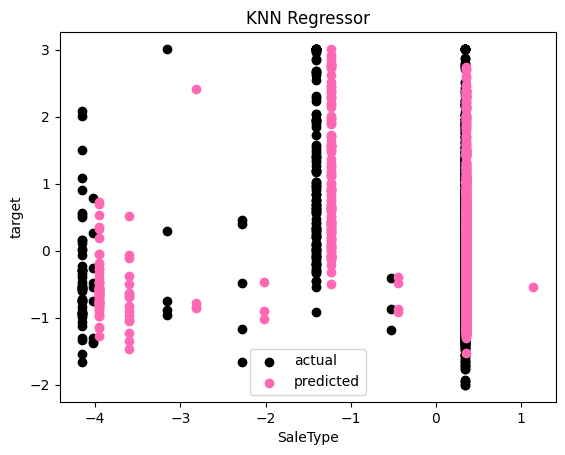

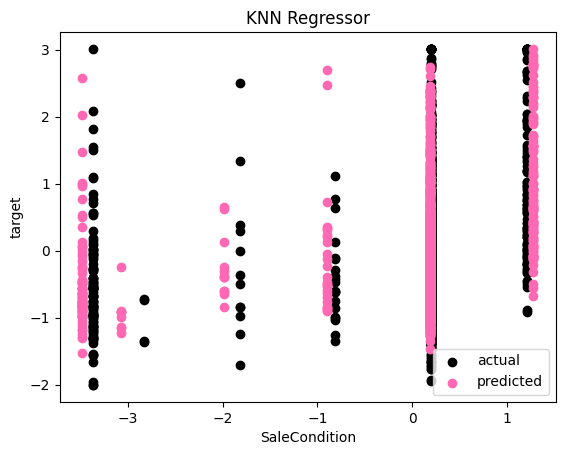

In [ ]:
y_pred = knnreg(X_train, y_train, test)

for col in test.columns:
  plt.scatter(X_train.loc[:, col], y_train, color='black', label='actual')
  plt.scatter(test.loc[:, col], y_pred, color='hotpink', label='predicted')
  plt.title('KNN Regressor')
  plt.xlabel(col)
  plt.ylabel('target')
  plt.legend()
  plt.show()


In [ ]:
# KMeans model
X_train, y_train, test = givedata(test, train)

kmeans = KMeans(n_clusters=5, random_state=30)

kmeans.fit(test)

y_pred_kmeans = kmeans.labels_

kmeans.fit(X_train)

y_train_kmeans = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


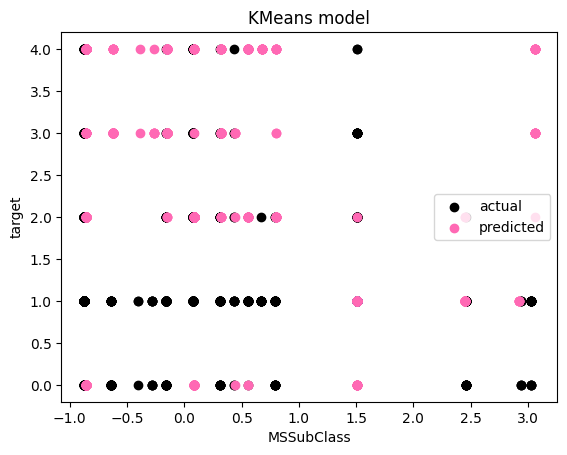

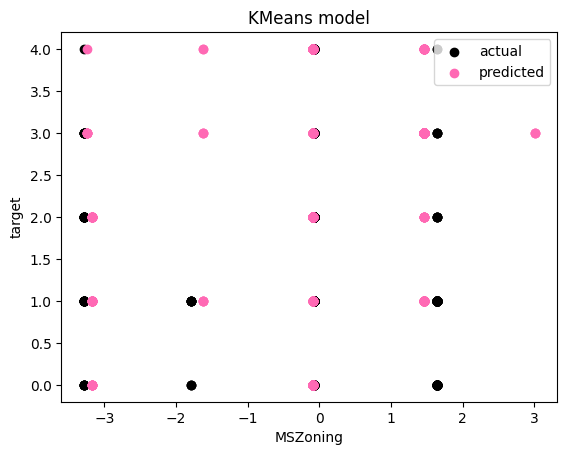

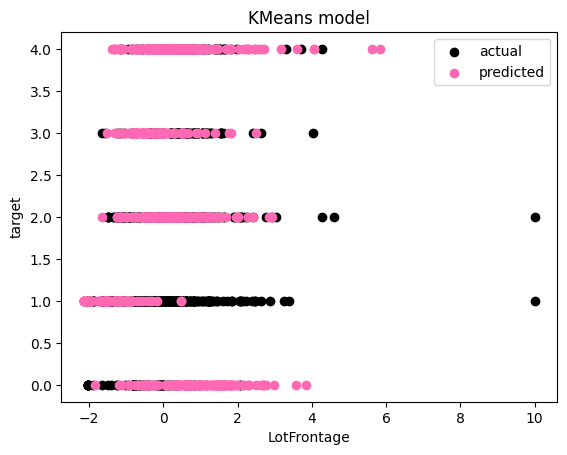

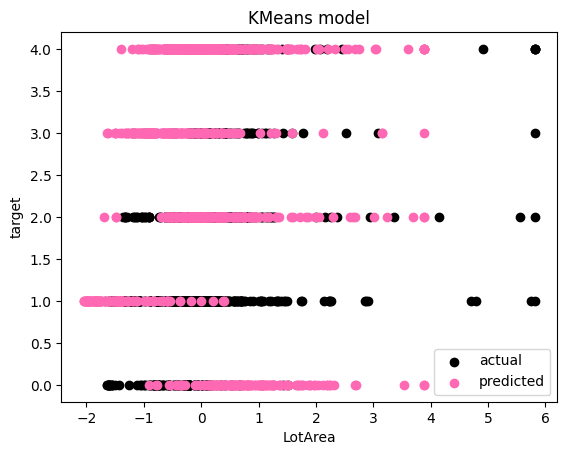

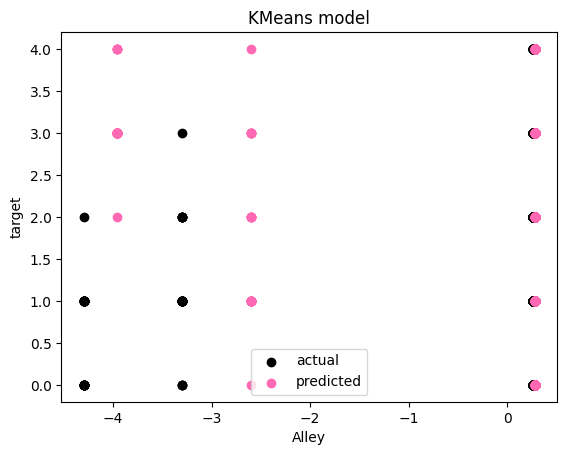

...

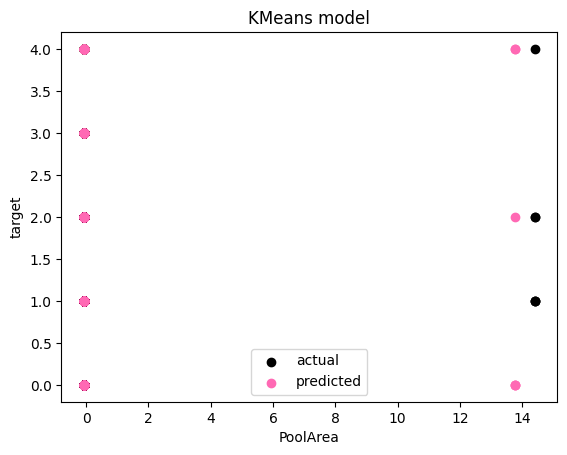

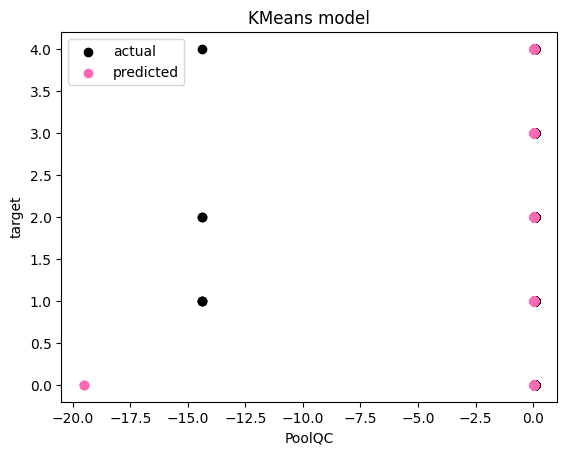

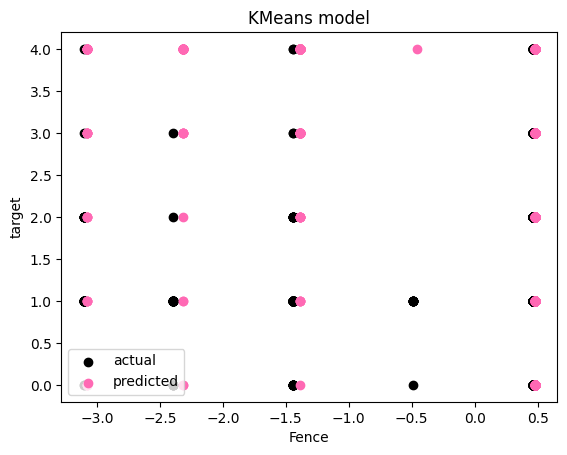

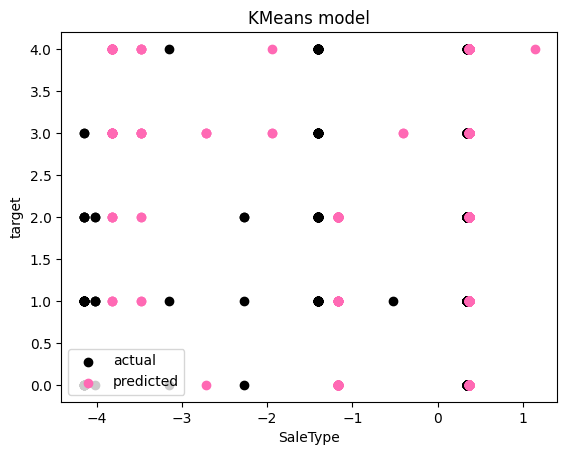

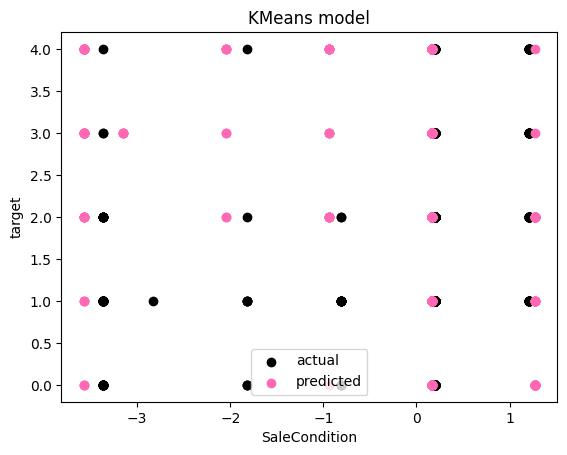

In [ ]:
# KMeans model visualising
y_train_discrete = pd.cut(y_train, bins=5, labels=False)

for col in test.columns:
  plt.scatter(X_train.loc[:, col], y_train_discrete, color='black', label='actual')
  plt.scatter(test.loc[:, col], y_pred_kmeans, color='hotpink', label='predicted')
  plt.title('KMeans model')
  plt.xlabel(col)
  plt.ylabel('target')
  plt.legend()
  plt.show()

In [ ]:
def predict_cost(MSSubClass, MSZoning, LotFrontage, LotArea, Alley,
                 LotShape, LandContour, LotConfig, LandSlope, Neighborhood, Condition1,
                 BldgType, HouseStyle, OverallQual, OverallCond, YearBuilt,
                 YearRemodAdd, RoofStyle, RoofMatl, Exterior1st, Exterior2nd, MasVnrType,
                 MasVnrArea, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond,
                 BsmtExposure, BsmtFinType1, BsmtFinSF1, BsmtFinType2, BsmtFinSF2,
                 BsmtUnfSF, TotalBsmtSF, HeatingQC, CentralAir, Electrical,
                 _1stFlrSF, _2ndFlrSF, LowQualFinSF, GrLivArea, FullBath,
                 HalfBath, BedroomAbvGr, KitchenAbvGr, KitchenQual, TotRmsAbvGrd,
                 Functional, Fireplaces, FireplaceQu, GarageType, GarageYrBlt,
                 GarageCars, GarageArea, GarageQual, GarageCond, PavedDrive,
                 WoodDeckSF, OpenPorchSF, EnclosedPorch, ScreenPorch, PoolArea,
                 PoolQC, Fence, SaleType, SaleCondition):
  import numpy as np
  import pandas as pd
  from matplotlib import pyplot as plt
  from sklearn.preprocessing import LabelEncoder
  from sklearn.model_selection import train_test_split
  from sklearn.neighbors import KNeighborsClassifier
  from sklearn.neighbors import KNeighborsRegressor
  from sklearn.metrics import mean_squared_error
  from sklearn.metrics import accuracy_score
  from sklearn.cluster import KMeans
  from sklearn.datasets import make_blobs
  !pip install gradio
  import gradio as gr

  test = pd.DataFrame(MSSubClass, MSZoning, LotFrontage, LotArea, Alley,
                 LotShape, LandContour, LotConfig, LandSlope, Neighborhood, Condition1,
                 BldgType, HouseStyle, OverallQual, OverallCond, YearBuilt,
                 YearRemodAdd, RoofStyle, RoofMatl, Exterior1st, Exterior2nd, MasVnrType,
                 MasVnrArea, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond,
                 BsmtExposure, BsmtFinType1, BsmtFinSF1, BsmtFinType2, BsmtFinSF2,
                 BsmtUnfSF, TotalBsmtSF, HeatingQC, CentralAir, Electrical,
                 _1stFlrSF, _2ndFlrSF, LowQualFinSF, GrLivArea, FullBath,
                 HalfBath, BedroomAbvGr, KitchenAbvGr, KitchenQual, TotRmsAbvGrd,
                 Functional, Fireplaces, FireplaceQu, GarageType, GarageYrBlt,
                 GarageCars, GarageArea, GarageQual, GarageCond, PavedDrive,
                 WoodDeckSF, OpenPorchSF, EnclosedPorch, ScreenPorch, PoolArea,
                 PoolQC, Fence, SaleType, SaleCondition)

  y = predict(test)

  return y

In [ ]:
# GRADIO

iface = gr.Interface(fn=predict_cost,
                     inputs=["number", "text", "number", "number", "text",
                             "text", "text", "text", "text", "text", "text",
                             "text", "text", "number", "number", "number",
                             "number", "text", "text", "text", "text", "text",
                             "number", "text", "text", "text", "text", "text",
                             "text", "text", "number", "text", "number",
                             "number", "number", "text", "text", "text",
                             "number", "number", "number", "number", "number",
                             "number", "number", "number", "text", "number",
                             "text", "number", "text", "text", "number",
                             "number", "number", "text", "text", "text",
                             "number", "number", "number", "number", "number",
                             "text", "text", "text", "text"],
                     outputs="number")
iface.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://da55fdcb8d7745c357.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


In [ ]:
predict_cost(60, MSZoning, LotFrontage, LotArea, Alley,
                 LotShape, LandContour, LotConfig, LandSlope, Neighborhood, Condition1,
                 BldgType, HouseStyle, OverallQual, OverallCond, YearBuilt,
                 YearRemodAdd, RoofStyle, RoofMatl, Exterior1st, Exterior2nd, MasVnrType,
                 MasVnrArea, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond,
                 BsmtExposure, BsmtFinType1, BsmtFinSF1, BsmtFinType2, BsmtFinSF2,
                 BsmtUnfSF, TotalBsmtSF, HeatingQC, CentralAir, Electrical,
                 _1stFlrSF, _2ndFlrSF, LowQualFinSF, GrLivArea, FullBath,
                 HalfBath, BedroomAbvGr, KitchenAbvGr, KitchenQual, TotRmsAbvGrd,
                 Functional, Fireplaces, FireplaceQu, GarageType, GarageYrBlt,
                 GarageCars, GarageArea, GarageQual, GarageCond, PavedDrive,
                 WoodDeckSF, OpenPorchSF, EnclosedPorch, ScreenPorch, PoolArea,
                 PoolQC, Fence, SaleType, SaleCondition):